<center>Universidade Federal de Viçosa</center>
<center>Coordenadoria de Educação Aberta e a Distância</center>
<center>Inteligência Artificial e Computacional</center>
<center>ELT578 - Análise de Imagens e Visão Computacional</center>

**<center>AULA PRÁTICA 4: Transformações Geométricas e Morfológicas, e Métricas de Qualidade de Imagem </center>**

*   **Transformações Geométricas:** translação, rotação, escalonamento, cisalhamento, reflexão e distorção (perspectiva).

*   **Transformações Morfológicas:** operações baseadas na forma (atuam principalmente sobre estruturas binárias).

*   **Métricas de Qualidade de Imagem:** construção de pequenas imagens e análise visual.


#1 Configurações iniciais

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


##1.2 Importando bibliotecas

In [ ]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

#2 Transformações Geométricas

* Translação: Move a imagem em uma direção específica, adicionando ou subtraindo uma quantidade fixa de pixels a todas as coordenadas dos pontos da imagem.
* Rotação: Gira a imagem em torno de um ponto específico, geralmente o centro da imagem, por um determinado ângulo.
* Escalonamento: Aumenta ou diminui o tamanho da imagem, alterando as distâncias entre os pontos dos eixos x e y por um fator de escala.
* Cisalhamento (Shear): Deforma a imagem alongando ou inclinando-a ao longo de um eixo, geralmente o eixo x ou y.
* Reflexão (Flip): Inverte a imagem horizontal ou verticalmente, produzindo um efeito de espelho.
* Projeção: Transformação que mapeia pontos tridimensionais em um plano bidimensional (em imagens 3D) ou mapeia pontos de uma imagem em uma superfície tridimensional (em reconstrução 3D).




(2048, 946, 3)


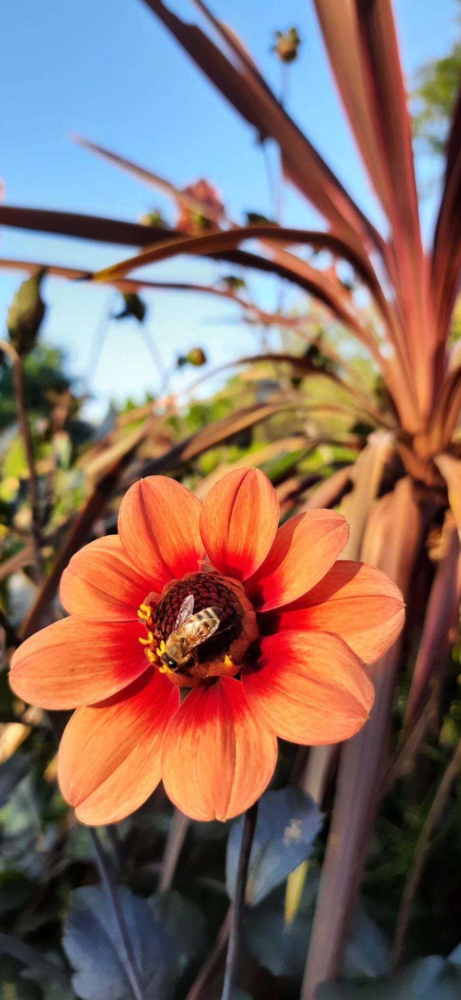

(2048, 946, 3)


In [ ]:
img = cv2.imread('/content/drive/MyDrive/ELT578/SEMANA_2/flower.jpeg')
h, w = img.shape[:2]
print(img.shape)

# 1. Translação (deslocar imagem 100px para direita e 50px para baixo)
M_translation = np.float32([[1, 0, 100], [0, 1, 50]])
img_translation = cv2.warpAffine(img, M_translation, (w, h))

# 2. Rotação (rotacionar 45 graus em torno do centro)
center = (w // 2, h // 2)
M_rotation = cv2.getRotationMatrix2D(center, 45, 1)  # 45° e escala 1
img_rotation = cv2.warpAffine(img, M_rotation, (w, h))

# 3. Escalonamento (reduzir para 50%)
img_scaling = cv2.resize(img, None, fx=0.5, fy=0.5, interpolation=cv2.INTER_LINEAR)

# 4. Cisalhamento (shear na horizontal)
M_shear = np.float32([[1, 0.5, 0], [0, 1, 0]])  # desloca colunas proporcionalmente às linhas
img_shear = cv2.warpAffine(img, M_shear, (w + int(0.5 * h), h))


# 5. Reflexão (espelhamento horizontal)
img_reflect = cv2.flip(img, 1)  # 1 = horizontal, 0 = vertical, -1 = ambos

cv2_imshow(img_reflect)
print(img_reflect.shape)

##2.1 Transformações Geométricas - Perspectiva

Transformação que mapeia pontos tridimensionais em um plano bidimensional (em imagens 3D) ou mapeia pontos de uma imagem em uma superfície tridimensional (em reconstrução 3D).

(780, 1040, 3)


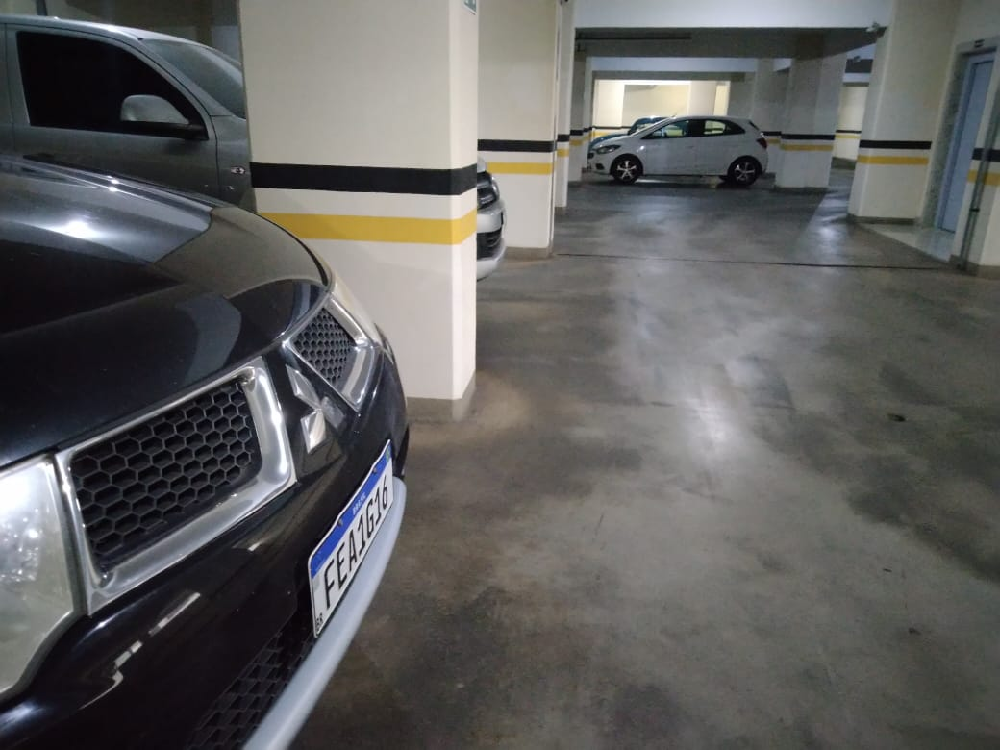

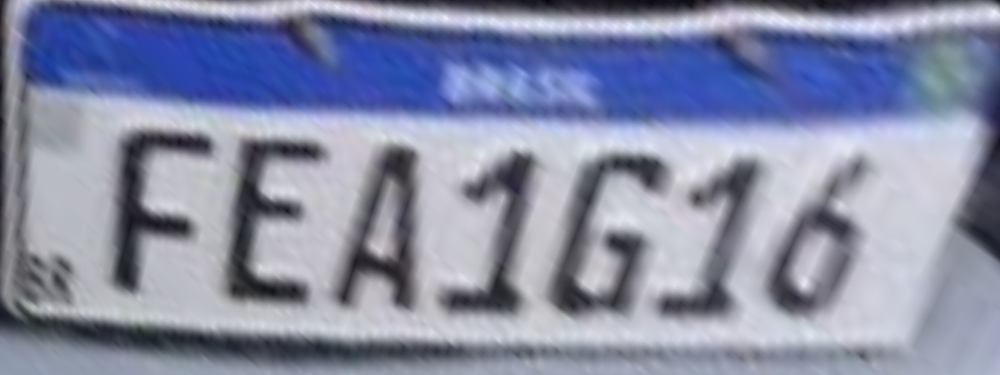

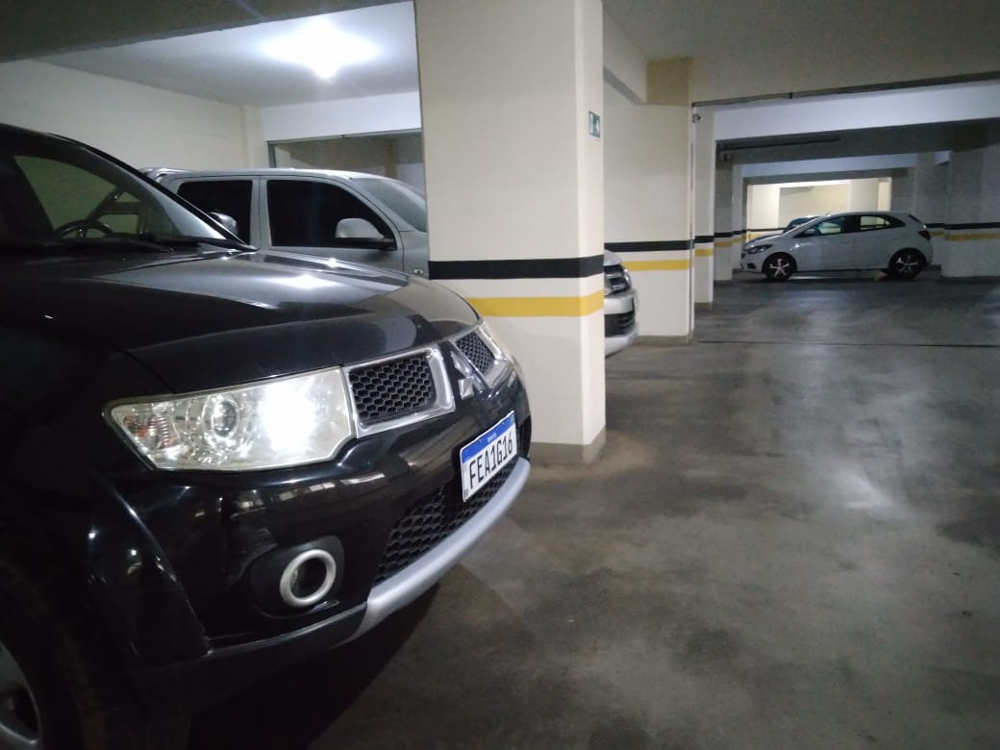

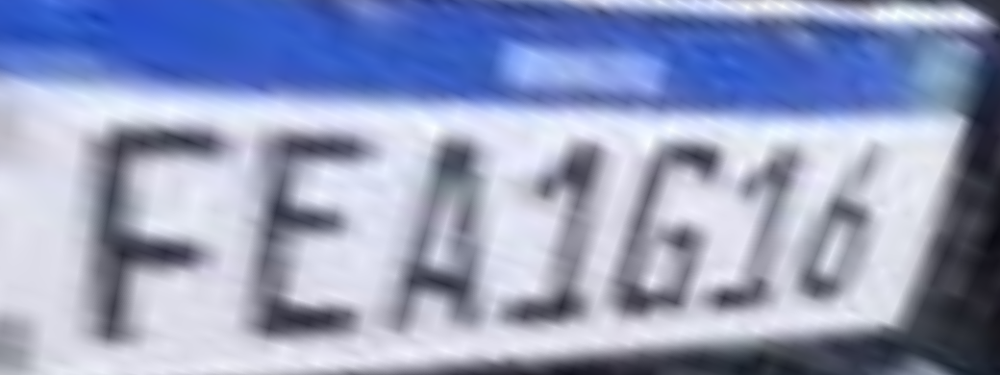

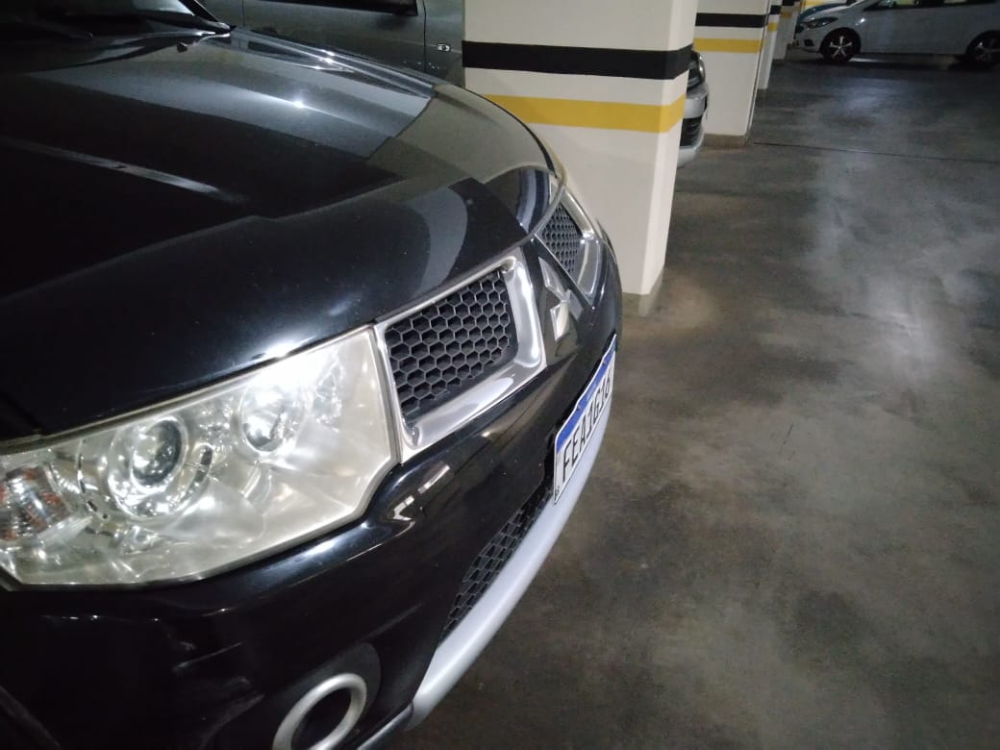

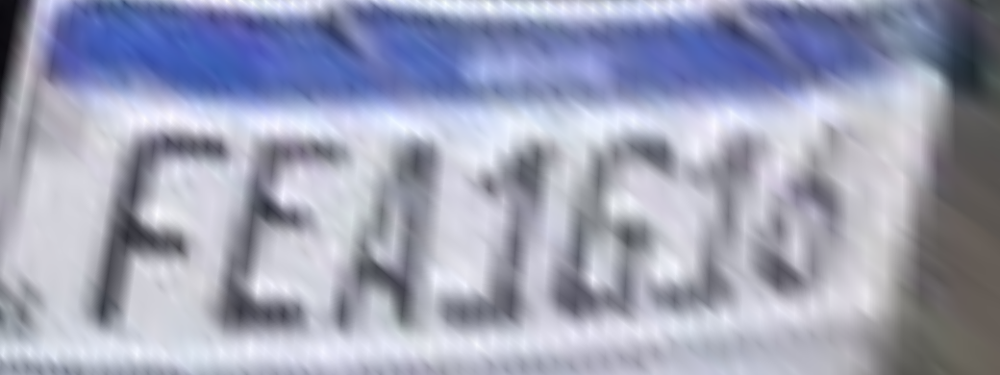

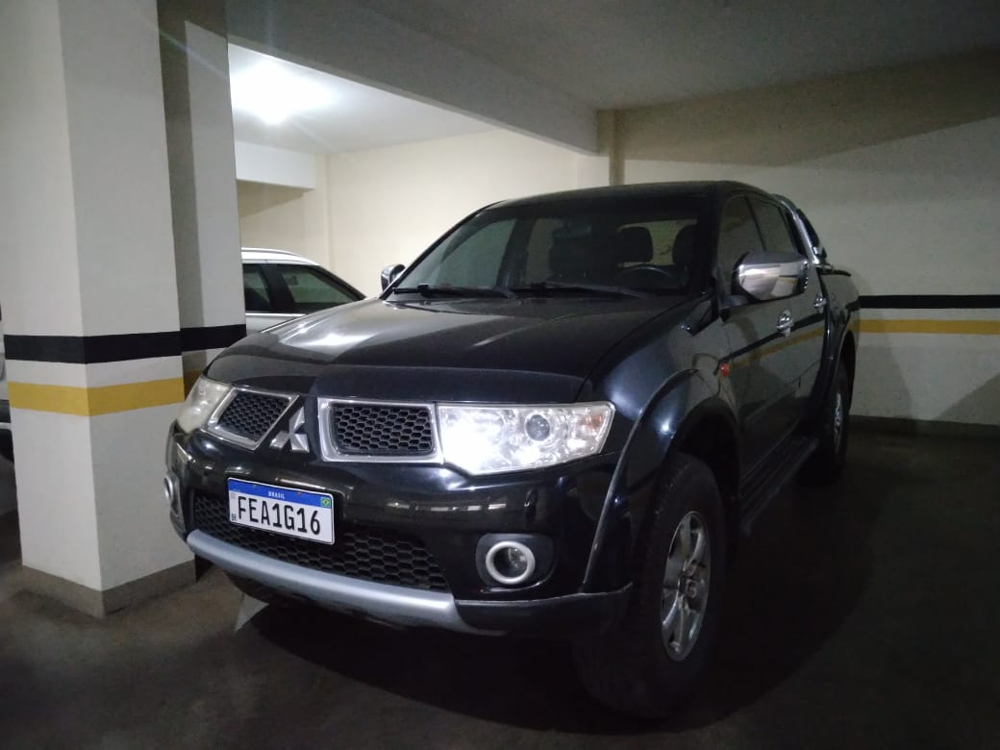

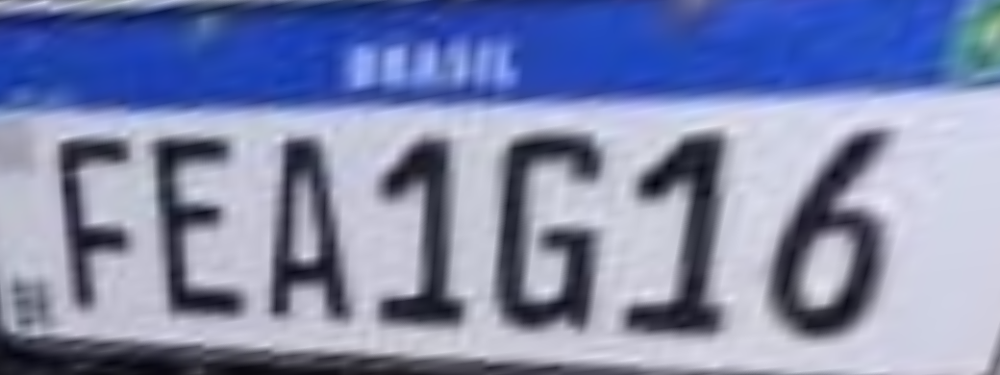

True

In [ ]:
#Imagem lateral 1
pt1=np.float32([[325, 585],[404, 467],[410, 513],[333, 652]])
pt2=np.float32([[48, 28],[1011, 60],[977, 341],[52, 317]])

I1=cv2.imread('/content/drive/MyDrive/ELT578/SEMANA_2/placa_lateral1.jpg')
print(I1.shape)

M=cv2.getPerspectiveTransform(pt1,pt2)
IT1=cv2.warpPerspective(I1,M,(1040,390))

cv2_imshow(I1) #original
cv2_imshow(IT1) #placa
cv2.imwrite('PLACAL1.png',IT1) #placa1

#Imagem lateral 2
pt1=np.float32([[485, 473], [534, 432], [540, 469], [487, 505]])
pt2=np.float32([[48, 28],[1011, 60],[977, 341],[52, 317]])

I2=cv2.imread('/content/drive/MyDrive/ELT578/SEMANA_2/placa_lateral2.jpg')
M=cv2.getPerspectiveTransform(pt1,pt2)
IT2=cv2.warpPerspective(I2,M,(1040,390))

cv2_imshow(I2)
cv2_imshow(IT2)
cv2.imwrite('PLACAL2.png',IT2)

#Imagem lateral 3
pt1=np.float32([[578, 463], [641, 359], [639, 402], [582, 505]])
pt2=np.float32([[48, 28],[1011, 60],[977, 341],[52, 317]])


I3=cv2.imread('/content/drive/MyDrive/ELT578/SEMANA_2/placa_lateral3.jpg')
M=cv2.getPerspectiveTransform(pt1,pt2)
IT3=cv2.warpPerspective(I3,M,(1040,390))

cv2_imshow(I3)
cv2_imshow(IT3)
cv2.imwrite('PLACAL3.png',IT3)

#Imagem lateral 4
pt1=np.float32([[247, 501], [335, 524], [339, 556],[245, 538]])
pt2=np.float32([[48, 28],[1011, 60],[977, 341],[52, 317]])

I4=cv2.imread('/content/drive/MyDrive/ELT578/SEMANA_2/placa_lateral4.jpg')
M=cv2.getPerspectiveTransform(pt1,pt2)
IT4=cv2.warpPerspective(I4,M,(1040,390))

cv2_imshow(I4)
cv2_imshow(IT4)
cv2.imwrite('PLACAL4.png',IT4)



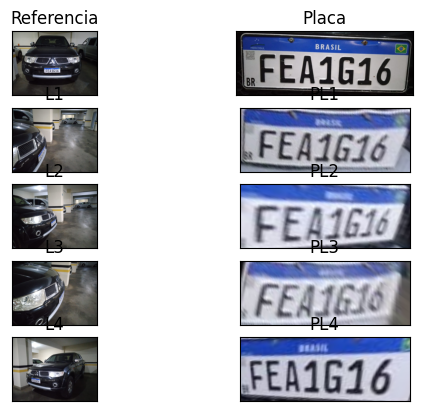

In [ ]:
#Visualizando todas as placas
from matplotlib import pyplot as plt

titulos = ['Referencia','Placa','L1','PL1','L2','PL2','L3','PL3','L4','PL4']
CR= cv2.imread('/content/drive/MyDrive/ELT578/SEMANA_2/placa_ampliada.jpg')
IR=cv2.imread('/content/drive/MyDrive/ELT578/SEMANA_2/placa_referencia.jpg')
imagens = [CR, IR, I1, IT1, I2, IT2, I3, IT3, I4, IT4]
for i in list(range(10)):
 plt.subplot (5,2,i+1), plt.imshow(cv2.cvtColor(imagens[i], cv2.COLOR_BGR2RGB))
 plt.title(titulos[i])
 plt.xticks([]), plt.yticks([])
plt.show()

#3 Transformações Morfológicas

* Erosão: remove pixels brancos nas bordas, útil para reduzir ruídos.

* Dilatação: expande regiões brancas, útil para unir elementos.

* Abertura: remove pequenos ruídos mantendo a forma.

* Fechamento: preenche pequenos buracos.

* Gradiente: realça as bordas dos objetos.

[[1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]]


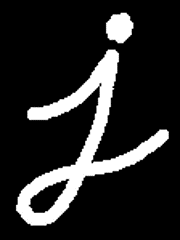

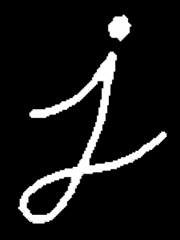

In [ ]:
img = cv2.imread('/content/drive/MyDrive/ELT578/SEMANA_2/j.png',0)
kernel = np.ones((5,5),np.uint8)
print(kernel)


#Erosao
erosion = cv2.erode(img,kernel,iterations = 1)
cv2_imshow(img)
cv2_imshow(erosion)

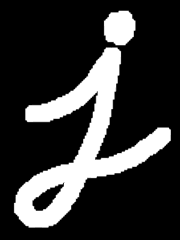

In [ ]:
dilation = cv2.dilate(img,kernel,iterations = 1)
cv2_imshow(dilation)

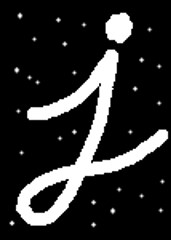

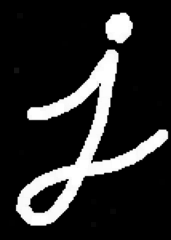

In [ ]:
#Abertura (#erosao mais dilatacao)
img = cv2.imread('/content/drive/MyDrive/ELT578/SEMANA_2/j_a.jpg',0)
opening = cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel)
cv2_imshow(img)
cv2_imshow(opening)

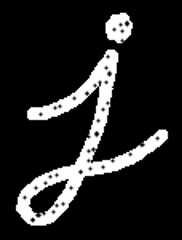

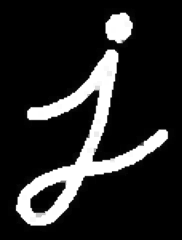

In [ ]:
#Fechamento (dilatacao + erosao)
img = cv2.imread('/content/drive/MyDrive/ELT578/SEMANA_2/j_f.jpg',0)
closing = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel)
cv2_imshow(img)
cv2_imshow(closing)

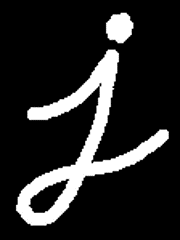

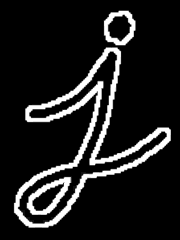

In [ ]:
img = cv2.imread('/content/drive/MyDrive/ELT578/SEMANA_2/j.png',0)
gradient = cv2.morphologyEx(img, cv2.MORPH_GRADIENT, kernel)
cv2_imshow(img)
cv2_imshow(gradient)

#4 Métricas de Qualidade de Imagem

* **Erro Quadrático Médio (MSE - Mean Squared Error):** Mede a média dos erros ao quadrado entre a imagem original (f) e a imagem comparada (g). Quanto menor o MSE, mais semelhantes são as imagens. Sensível a grandes diferenças, pois os erros são elevados ao quadrado.

* **Erro Máximo (ME - Maximum Error):** Representa a maior diferença absoluta entre os pixels das duas imagens. Indica o pior caso de erro. Útil para identificar outliers ou erros localizados.

* **Erro Médio Absoluto (MAE - Mean Absolute Error):** Mede a média das diferenças absolutas entre as imagens. Não penaliza tanto grandes diferenças como o MSE. Interpretação simples: quanto menor, melhor.

* **Raiz do Erro Quadrático Médio (RMSE - Root Mean Squared Error):** É a raiz quadrada do MSE. Mantém a unidade dos valores originais (diferente do MSE que é ao quadrado). Fácil de interpretar: quanto menor, mais próxima está a imagem processada da original.

* **Erro Médio Quadrático Normalizado (NMSE - Normalized Mean Squared Error):**
Normaliza o MSE em relação à energia da imagem original. Permite comparar erros entre imagens com diferentes níveis de intensidade ou contraste. Próximo de 0 indica alta similaridade.

* **Coeficiente de Correlação:** Mede a correlação linear entre as imagens. Considera variação global, não apenas diferenças ponto a ponto. Valores: +1 → correlação perfeita (idênticas, exceto escala); 0 → sem correlação; -1 → inversamente correlacionadas.

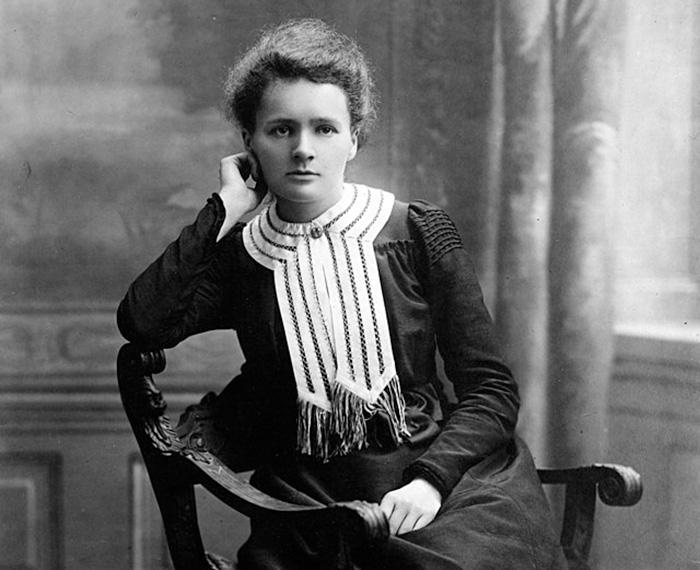

(570, 700, 3)


In [ ]:
ie=cv2.imread("/content/drive/MyDrive/ELT578/SEMANA_2/marie_curie.jpg")
cv2_imshow(ie)
print(ie.shape)

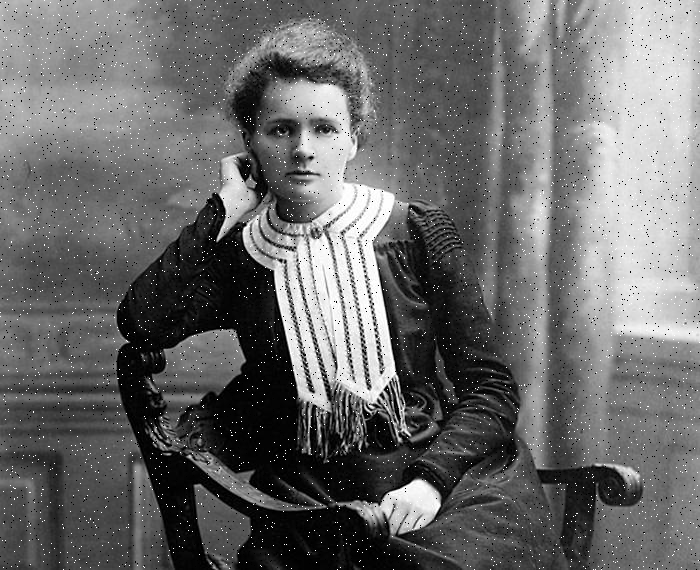

In [ ]:
#Salt & Pepper (Chuvisco)
def add_chuvisco(original, controle):
    ruido = np.random.rand(original.shape[0], original.shape[1])
    ruidosa = original.copy()
    ruidosa[ruido < controle] = 0       # pontos pretos
    ruidosa[ruido > 1-controle] = 255   # pontos brancos
    return ruidosa

ie_noisy = add_chuvisco(ie, 0.01)
cv2_imshow(ie_noisy)

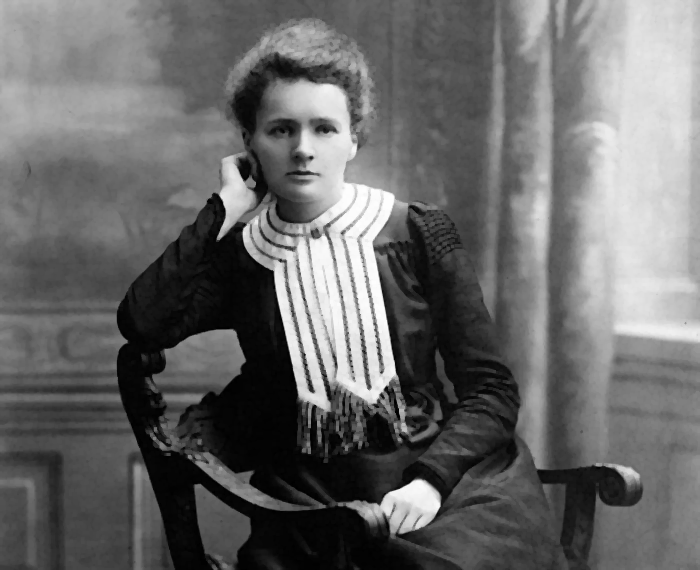

In [ ]:
median_filtered = cv2.medianBlur(ie_noisy, 3)
kernel = np.ones((3, 3), np.uint8)
ie_p = cv2.morphologyEx(median_filtered, cv2.MORPH_OPEN, kernel)
cv2_imshow(ie_p)

In [ ]:

def calc_metrics(f, g):
    # Erro Quadrático Médio
    MSE = np.sum(np.square(f.astype(float) - g.astype(float))) / (f.shape[0] * f.shape[1])

    # Erro Máximo
    ME = np.max(np.abs(f.astype(float) - g.astype(float)))

    # Erro Médio Absoluto
    MAE = np.sum(np.abs(f.astype(float) - g.astype(float))) / (f.shape[0] * f.shape[1])

    # Raiz do Erro Quadrático Médio
    RMSE = np.sqrt(MSE)

    # Erro Médio Quadrático Normalizado
    NMSE = MSE / np.sum(np.square(f.astype(float)))

    # Coeficiente de correlação
    Corr = np.corrcoef(f.flatten(), g.flatten())[0, 1]

    return {
        'MSE': MSE,
        'ME': ME,
        'MAE': MAE,
        'RMSE': RMSE,
        'NMSE': NMSE,
        'Correlation': Corr
    }

# Exemplo com imagens ie (original), ie_noisy e ie_p (processada)
metrics_noisy = calc_metrics(ie, ie_noisy)
metrics_processed = calc_metrics(ie, ie_p)

print("Métricas entre Original e Ruído:")
for k, v in metrics_noisy.items():
    print(f"{k}: {v:.4f}")

print("\nMétricas entre Original e Processada:")
for k, v in metrics_processed.items():
    print(f"{k}: {v:.4f}")

Métricas entre Original e Ruído:
MSE: 1256.6886
ME: 255.0000
MAE: 7.6025
RMSE: 35.4498
NMSE: 0.0000
Correlation: 0.9528

Métricas entre Original e Processada:
MSE: 191.9489
ME: 201.0000
MAE: 8.9938
RMSE: 13.8546
NMSE: 0.0000
Correlation: 0.9926


##4.1) SSIM – Structural Similarity Index

* Mede a similaridade estrutural entre duas imagens, considerando luminância, contraste e estrutura. Baseado em similaridade perceptual (como o olho humano percebe). Varia entre -1 e 1, sendo:

* 1 → imagens idênticas.

* Próximo de 1 → muito similares.
* < 0.5 → diferentes estruturalmente.


In [ ]:
from skimage.metrics import structural_similarity as ssim

# SSIM: mede a similaridade perceptual (considera luminância, contraste e estrutura)
# Varia entre -1 e 1: 1 = imagens idênticas, próximo de 1 = alta similaridade.

ssim_noisy = ssim(ie, ie_noisy, win_size=3, channel_axis=-1)
ssim_processed = ssim(ie, ie_p, win_size=3, channel_axis=-1)

print("\n### Métrica SSIM (Similaridade Estrutural) ###")
print(f"Original vs Ruído: SSIM = {ssim_noisy:.4f}")
print(f"Original vs Processada: SSIM = {ssim_processed:.4f}")



### Métrica SSIM (Similaridade Estrutural) ###
Original vs Ruído: SSIM = 0.8655
Original vs Processada: SSIM = 0.9018


**DESAFIO**
 * Detecção automática de pontos para transformação em perspectiva